## AIDA reactive experiments

In [1]:
using Rocket
using ReactiveMP
using GraphPPL
using Distributions
using LinearAlgebra
import ProgressMeter
using WAV
using Plots
using AIDA

┌ Info: Precompiling AIDA [02ab3c64-7f6e-4624-92b1-4056b28faae1]
└ @ Base loading.jl:1317


In [2]:
# load clean speech
cl, fs = wavread("../sound/NOIZEUS/clean/sp03.wav")
cl_seg = get_frames(cl, fs);
totseg = size(cl_seg, 1)

300

In [3]:
bbl, fs = wavread("../sound/NOIZEUS/babble/10dB/sp03_babble_sn10.wav")
bbl_seg = get_frames(bbl, fs);
totseg = size(bbl_seg, 1)

300

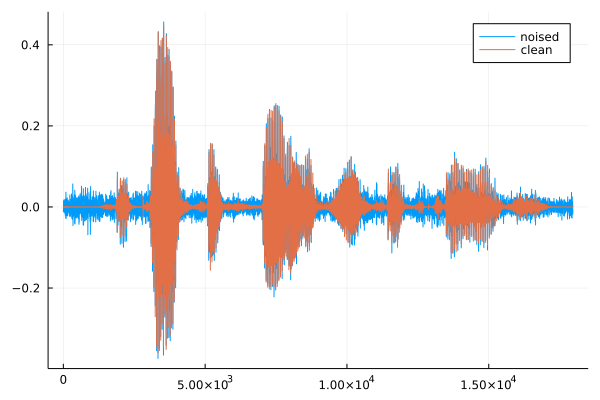

In [4]:
plot(bbl, label="noised")
plot!(cl, label="clean")

In [417]:
# storage of FEs for each segment
ar_order = 10
vmp_iter = 20
fe_ar = zeros(totseg, vmp_iter)
fe_gaussian = zeros(totseg, vmp_iter)
mτs = [];

Any[]

In [418]:
# compute free energies of two models (gaussian for silent frame, lar for voiced frame)
ProgressMeter.@showprogress for segnum in 1:totseg
    inputs, outputs = ar_ssm(bbl_seg[segnum, :], ar_order)
    γ, τ, θ, x, fear = lar_inference_ex(outputs, vmp_iter, priors=Dict(:aτ => 1e-4, :bτ => 1e-4, 
                                                                       :aγ => 1e-4, :bγ => 1e-4, 
                                                                       :order => ar_order))
    # γ, θ, fear = ar_inference(inputs, outputs, ar_order, vmp_iter, 1.0, 1.0)
    # mθ, vθ = mean(θ), cov(θ)
    # mγ = mean(γ)
    fe_ar[segnum, :] = fear
    
    x, τ, fegas = inference_gaussian(outputs, vmp_iter, priors=Dict(:aτ => 1e-4, :bτ => 1e-4))
    # mx, vx = mean(x), cov(x)
    # mγ = mean(γ)
    push!(mτs, τ)
    fe_gaussian[segnum, :] = fegas

end

Progress: 100%|█████████████████████████████████████████| Time: 0:02:43


In [379]:
# detect silent frames based on model comparison (1 - voiced, 0 - silent)
vad = [x[end] < y[end] for (x, y) in zip(eachrow(fe_ar), eachrow(fe_gaussian))];

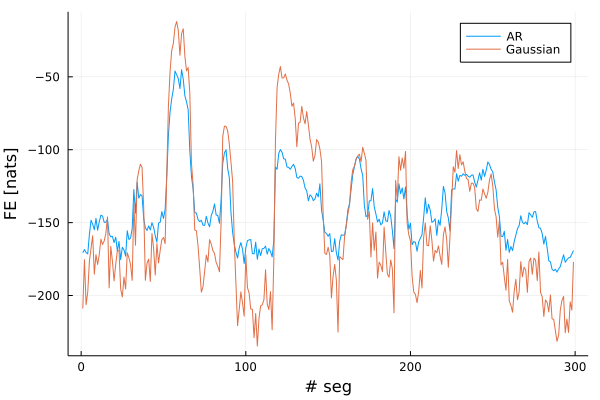

In [419]:
plot(fe_ar[1:end-1, end], label="AR")
plot!(fe_gaussian[1:end-1, end], label="Gaussian", ylabel="FE [nats]", xlabel="# seg")

In [420]:
using ImageCore

activities = get_signal(Float64.(hcat([repeat([vd], size(bbl_seg, 2)) for vd in vad]...))', fs)
cmap = colorsigned(color("blue"), color("red")) ∘ scalesigned(0, 0.5, 1.0)
colors = cmap.(activities)
plot(bbl, label="noised")
plot!(cl, label="clean")
scatter!(activities .- 0.5, label=false, color=colors, markerstrokewidth=0.0, markersize=0.6, markershape=:star)

In [395]:
babble = get_signal(bbl_seg[findall(isequal(0), vad), :], fs)

10860-element Vector{Float64}:
  0.011658070619830927
  0.0012512588885158849
 -0.012024292733542894
 -0.027771843623157447
 -0.04281746879482406
 -0.02563554795983764
  0.004821924497207556
  0.02249214148380993
  0.023865474410229806
  0.012909329508346813
 -0.007141331217383343
 -0.025147251808221686
 -0.01434369945371868
  ⋮
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0

In [21]:
# get empirical prior for babble noise
# τ_emp = 1365.4296025048907
τ_emp = inv(cov(babble))

1365.4296025048907

In [432]:
aτ_ = mean(first.(params.(mτs[findall(isequal(0), vad)])))
bτ_ = mean(last.(params.(mτs[findall(isequal(0), vad)])));

## LAR model with **fixed** measurement noise

In [22]:
bblmx, bblvx, bblmθ, bblvθ, bblγ, fe = lar_batch_learning_ex(bbl_seg, 10, Dict(:τ => τ_emp, :aγ => 1.0, :order => 10));

Progress:   4%|█▊                                       |  ETA: 0:01:20

In [422]:
mx = get_signal(bblmx, fs)
vx = get_signal(bblvx, fs);

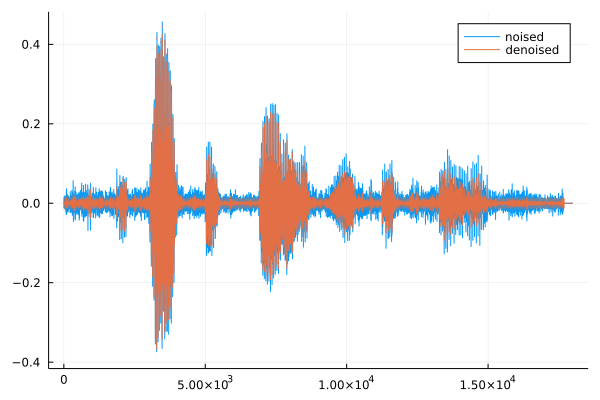

In [423]:
plot(signal_alignment(bbl, fs), label="noised")
# plot!(signal_alignment(cl, fs), label="clean")
plot!(mx, ribbon=sqrt.(vx), label="denoised")

In [424]:
snr_before = SNR_2(signal_alignment(cl, fs), signal_alignment(bbl, fs))
snr_after = SNR_2(signal_alignment(cl, fs), mx)
snr_after - snr_before

2.349377530870182

## LAR model with **unknown** measurement noise

In [434]:
bblmx, bblvx, bblmθ, bblvθ, bblγ = lar_batch_learning_ex(bbl_seg, 10, Dict(:aτ => aτ_, :bτ => bτ_, :aγ => 1.0, :bγ => 1e-4, :order => 10));

Progress: 100%|█████████████████████████████████████████| Time: 0:01:28


In [17]:
mx = get_signal(bblmx, fs)
vx = get_signal(bblvx, fs);

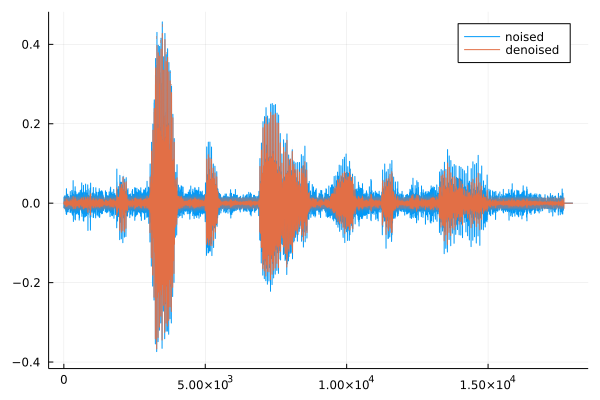

In [18]:
plot(signal_alignment(bbl, fs), label="noised")
plot!(mx, ribbon=sqrt.(vx), label="denoised")

In [19]:
snr_before = SNR_2(signal_alignment(cl, fs), signal_alignment(bbl, fs))
snr_after = SNR_2(signal_alignment(cl, fs), mx)
snr_after - snr_before

2.5435956965300672

## Coupled model (AR speech + AR noise)

In [445]:
mη, vη, τ = prior_to_priors(zeros(2), diageye(2), (aτ_, bτ_), totseg, 2);
rmz, rvz, rmθ, rvθ, rγ, rmx, rvx, rmη, rvη, rτ, fe = batch_coupled_learning(bbl_seg, [mη, vη], τ, 10, 2, 10);

Progress: 100%|█████████████████████████████████████████| Time: 0:02:32


In [ ]:
rz, rx = get_signal(rmz, fs), get_signal(rmx, fs)
vz, vx = get_signal(rvz, fs), get_signal(rvx, fs);

LoadError: UndefVarError: get_signal not defined

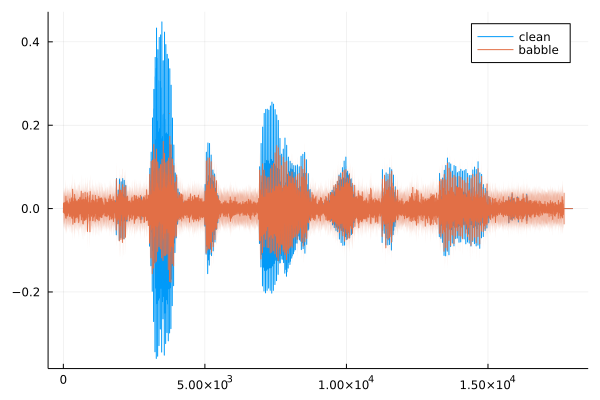

In [444]:
plot(signal_alignment(cl, fs), label="clean")
plot!(rz, ribbon=sqrt.(vz), label="denoised speech")
plot!(rx, ribbon=sqrt.(vx), label="babble")

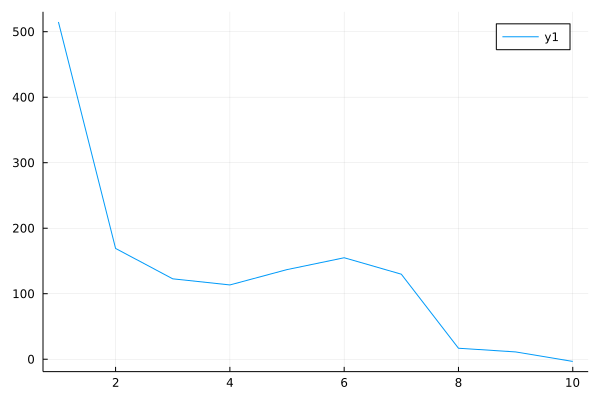

In [442]:
plot(fe[1, :])

In [443]:
snr_before = SNR_2(signal_alignment(cl, fs), signal_alignment(bbl, fs))
snr_after = SNR_2(signal_alignment(cl, fs), rz)
snr_after - snr_before

-4.49524612003205

In [227]:
wavwrite(rz, fs, "/Users/apodusenko/Desktop/denoised_speech.wav")

In [199]:
wavwrite(bbl, fs, "/Users/apodusenko/Desktop/dirty.wav")

In [24]:
# load forest sound
fr, fs = wavread("sound/environment/forest_old.wav");

In [26]:
fr_seg = get_frames(fr, fs)
frmx, frvx, frmθ, frvθ, frγ = lar_batch_learning(fr_seg, 5, 10, 1e-12);

Progress: 100%|█████████████████████████████████████████| Time: 0:00:56


In [27]:
ar_order = 2
inputs, outputs = ar_ssm(fr[1:10:end], ar_order)
γ, θ, fe = inference_ar(inputs, outputs, ar_order, 10)
println(mean(θ), "\t", mean(γ))

Progress: 100%|█████████████████████████████████████████| Time: 0:03:10


[0.8736889491613922, -0.1749365872955999]	957.349073007666


In [72]:
ar_order = 2
inputs, outputs = ar_ssm(fr[1:100:end], ar_order)
γ, θ, fe = inference_ar(inputs, outputs, ar_order, 10)
println(mean(θ), "\t", mean(γ))

Progress:  90%|████████████████████████████████████▉    |  ETA: 0:00:00

[-0.20323649754037096, -0.13362197085378788]	102.9944354972934


Progress: 100%|█████████████████████████████████████████| Time: 0:00:01


In [4]:
# train sound
tr, fs = wavread("sound/environment/train.wav")

([0.003204443494979705; 3.051850947599719e-5; … ; -0.007019257179479354; 0.0022583697012237922], 8000.0f0, 0x0010, WAVChunk[WAVChunk(Symbol("fmt "), UInt8[0x10, 0x00, 0x00, 0x00, 0x01, 0x00, 0x01, 0x00, 0x40, 0x1f, 0x00, 0x00, 0x80, 0x3e, 0x00, 0x00, 0x02, 0x00, 0x10, 0x00]), WAVChunk(:LIST, UInt8[0x49, 0x4e, 0x46, 0x4f, 0x49, 0x4e, 0x41, 0x4d, 0x08, 0x00  …  0x73, 0x70, 0x65, 0x63, 0x74, 0x6f, 0x72, 0x4a, 0x00, 0x00]), WAVChunk(Symbol("id3 "), UInt8[0x49, 0x44, 0x33, 0x03, 0x00, 0x00, 0x00, 0x00, 0x00, 0x26  …  0x07, 0x00, 0x00, 0x00, 0x38, 0x2e, 0x38, 0x2e, 0x31, 0x37])])

In [5]:
tr_seg = get_frames(tr, fs)
trmx, trvx, trmθ, trvθ, trγ = lar_batch_learning(tr_seg, 2, 10, 1e-12);

Progress: 100%|█████████████████████████████████████████| Time: 0:00:45


In [6]:
mean(trmθ, dims=1)

1×2 Matrix{Float64}:
 1.04547  -0.198163

In [7]:
trγ[end][1]/trγ[end][2]

33975.83692549487

In [57]:
trγ[end]

(41.0, 0.0012056489163429355)

In [82]:
ar_order = 10
inputs, outputs = ar_ssm(tr[1:10:end], ar_order)
γ, θ, fe = inference_ar(inputs, outputs, ar_order, 10)
println(mean(θ), "\t", mean(γ))

Progress:  90%|████████████████████████████████████▉    |  ETA: 0:00:00

[0.05580275684828447, -0.06971276403550794, 0.03605368101506624, -0.12498182953809668, -0.0849619878863063, 0.10622721636016212, 0.15419279043573297, -0.04245459143726561, -0.16477088656525696, 0.07056581449065422]	92.28078085307476


Progress: 100%|█████████████████████████████████████████| Time: 0:00:04


In [96]:
p1, p2 = calc_PESQ(get_signal(cl_seg, fs), get_signal(sb_seg, fs), get_signal(rmz, fs), fs)

(1.488070011138916, 1.6407175064086914)

In [97]:
pesq_gain = p2 - p1

0.1526474952697754